In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')


In [2]:
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import cohen_kappa_score, roc_auc_score
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import log_loss

def classification_metric(y_test,y_pred,y_prob,label,n=1,verbose=False):
    """
    Note: only for binary classification
    confusionmatrix(y_true,y_pred,labels=['No','Yes'])
    """
    # confusion matrix
    cm = confusion_matrix(y_test,y_pred)
    row_sum = cm.sum(axis=0)
    cm = np.append(cm,row_sum.reshape(1,-1),axis=0)
    col_sum = cm.sum(axis=1)
    cm = np.append(cm,col_sum.reshape(-1,1),axis=1)

    labels = label+['Total']
    plt.figure(figsize=(10,6))
    sns.heatmap(cm,annot=True,cmap='summer',fmt='0.2f',xticklabels=labels,
                yticklabels=labels,linewidths=3,cbar=None,)

    plt.xlabel('Predicted Values')
    plt.ylabel('Actual Values')
    plt.title('Confusion Matrix')
    plt.show()
    
    print('*'*30+'Classifcation Report'+'*'*30+'\n\n')
    cr = classification_report(y_test,y_pred)
    print(cr)
    
    print('\n'+'*'*36+'Kappa Score'+'*'*36+'\n\n')
    # Kappa score
    kappa = cohen_kappa_score(y_test,y_pred) # Kappa Score
    print('Kappa Score =',kappa)
    
    print('\n'+'*'*30+'Area Under Curve Score'+'*'*30+'\n\n')
    # Kappa score
    roc_a = roc_auc_score(y_test,y_pred) # Kappa Score
    print('AUC Score =',roc_a)
    
    # ROC
    plt.figure(figsize=(8,5))
    fpr,tpr, thresh = roc_curve(y_test,y_prob)
    plt.plot(fpr,tpr,'r')
    print('Number of probabilities to build ROC =',len(fpr))
    if verbose == True:
        for i in range(len(thresh)):
            if i%n == 0:
                plt.text(fpr[i],tpr[i],'%0.2f'%thresh[i])
                plt.plot(fpr[i],tpr[i],'v')


    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characterstic')
    plt.legend(['AUC = {}'.format(roc_a)])
    plt.plot([0,1],[0,1],'b--',linewidth=2.0)
    plt.grid()
    plt.show()
    
    
class threshold():
    '''
    Setting up the threshold points
    '''
    def __init__(self):
        self.th = 0.5
        
    def predict_threshold(self,y):
        if y >= self.th:
            return 1
        else:
            return 0

In [3]:
df=pd.read_csv('C://Users//Nandini MUKKA//Downloads//HR_data.csv')
df.head()

,SLNO,Candidate.Ref,DOJ.Extended,Duration.to.accept.offer,Notice.period,Offered.band,Pecent.hike.expected.in.CTC,Percent.hike.offered.in.CTC,Percent.difference.CTC,Joining.Bonus,Candidate.relocate.actual,Gender,Candidate.Source,Rex.in.Yrs,LOB,Location,Age,Status
0,1,2110407,Yes,14,30,E2,-20.79,13.16,42.86,No,No,Female,Agency,7,ERS,Noida,34,Joined
1,2,2112635,No,18,30,E2,50.00,320.00,180.00,No,No,Male,Employee Referral,8,INFRA,Chennai,34,Joined
2,3,2112838,No,3,45,E2,42.84,42.84,0.00,No,No,Male,Agency,4,INFRA,Noida,27,Joined
3,4,2115021,No,26,30,E2,42.84,42.84,0.00,No,No,Male,Employee Referral,4,INFRA,Noida,34,Joined
4,5,2115125,Yes,1,120,E2,42.59,42.59,0.00,No,Yes,Male,Employee Referral,6,INFRA,Noida,34,Joined


In [4]:
df.shape

(8995, 18)

In [5]:
x=df.iloc[:,:-1] #independent
y=df.iloc[:,-1] # dependent

In [6]:
x.head()

,SLNO,Candidate.Ref,DOJ.Extended,Duration.to.accept.offer,Notice.period,Offered.band,Pecent.hike.expected.in.CTC,Percent.hike.offered.in.CTC,Percent.difference.CTC,Joining.Bonus,Candidate.relocate.actual,Gender,Candidate.Source,Rex.in.Yrs,LOB,Location,Age
0,1,2110407,Yes,14,30,E2,-20.79,13.16,42.86,No,No,Female,Agency,7,ERS,Noida,34
1,2,2112635,No,18,30,E2,50.00,320.00,180.00,No,No,Male,Employee Referral,8,INFRA,Chennai,34
2,3,2112838,No,3,45,E2,42.84,42.84,0.00,No,No,Male,Agency,4,INFRA,Noida,27
3,4,2115021,No,26,30,E2,42.84,42.84,0.00,No,No,Male,Employee Referral,4,INFRA,Noida,34
4,5,2115125,Yes,1,120,E2,42.59,42.59,0.00,No,Yes,Male,Employee Referral,6,INFRA,Noida,34


In [7]:
y.head()

0    Joined
1    Joined
2    Joined
3    Joined
4    Joined
Name: Status, dtype: object

In [8]:
y.replace(['Joined','Not Joined'],[0,1],inplace=True)

In [9]:
xd=pd.get_dummies(x)
xd.head()

,SLNO,Candidate.Ref,Duration.to.accept.offer,Notice.period,Pecent.hike.expected.in.CTC,Percent.hike.offered.in.CTC,Percent.difference.CTC,Rex.in.Yrs,Age,DOJ.Extended_No,...,Location_Bangalore,Location_Chennai,Location_Cochin,Location_Gurgaon,Location_Hyderabad,Location_Kolkata,Location_Mumbai,Location_Noida,Location_Others,Location_Pune
0,1,2110407,14,30,-20.79,13.16,42.86,7,34,0,...,0,0,0,0,0,0,0,1,0,0
1,2,2112635,18,30,50.00,320.00,180.00,8,34,1,...,0,1,0,0,0,0,0,0,0,0
2,3,2112838,3,45,42.84,42.84,0.00,4,27,1,...,0,0,0,0,0,0,0,1,0,0
3,4,2115021,26,30,42.84,42.84,0.00,4,34,1,...,0,0,0,0,0,0,0,1,0,0
4,5,2115125,1,120,42.59,42.59,0.00,6,34,0,...,0,0,0,0,0,0,0,1,0,0


In [10]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: Status, dtype: int64

In [11]:
np.random.seed(1001)
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(xd,y,test_size=0.2)

In [12]:
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((7196, 44), (1799, 44), (7196,), (1799,))

In [13]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz

In [14]:
model=DecisionTreeClassifier(criterion='gini',max_depth=None)

In [15]:
model.fit(x_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [16]:
y_pred=model.predict(x_test)
y_pred_prob=model.predict_proba(x_test)[:,-1] # considering probability of 1

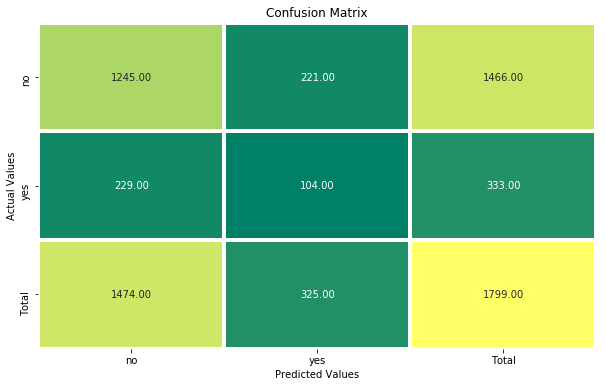

******************************Classifcation Report******************************


              precision    recall  f1-score   support

           0       0.84      0.85      0.85      1466
           1       0.32      0.31      0.32       333

    accuracy                           0.75      1799
   macro avg       0.58      0.58      0.58      1799
weighted avg       0.75      0.75      0.75      1799


************************************Kappa Score************************************


Kappa Score = 0.1630758860819691

******************************Area Under Curve Score******************************


AUC Score = 0.5807809856240962
Number of probabilities to build ROC = 3


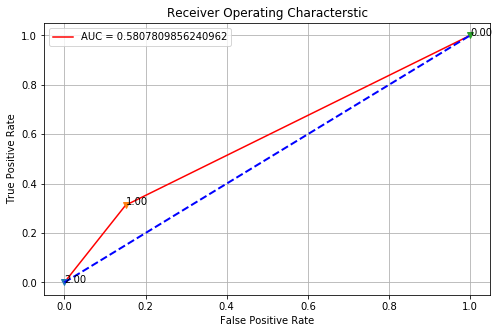

In [17]:
classification_metric(y_test,y_pred,y_pred_prob,['no','yes'],n=1,verbose=True)

In [18]:
import pydotplus

In [19]:
export_graphviz(model,out_file='HR.odt',feature_names=x_train.columns,filled=True)

In [20]:
graph=pydotplus.graph_from_dot_file('HR.odt')

In [21]:
graph.write_pdf('HR_tree.pdf')

True

In [22]:
graph.write_jpg('HR_tree.jpg')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.547659 to fit



True

In [23]:
from IPython.display import Image
Image('HR_tree.jpg')

**here we got very bad kappa score and AUC is also not satsifiable due to imbalance of data so we do resample of data**

In [24]:
import imblearn
from imblearn.over_sampling import SMOTE

In [25]:
x_resample,y_resample=SMOTE(k_neighbors=5).fit_resample(xd,y)

1    7313
0    7313
dtype: int64

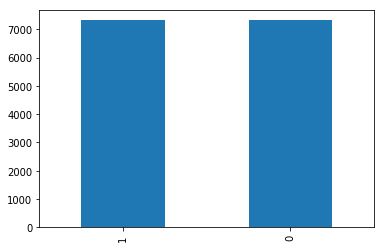

In [26]:
pd.Series(y_resample).value_counts().plot('bar')
pd.Series(y_resample).value_counts()

In [27]:
np.savez('hroversample1.npz',x_resample,y_resample)

In [28]:
data_over=np.load('hroversample1.npz')
data_over.files

['arr_0', 'arr_1']

In [29]:
x_over1=data_over['arr_0']
y_over1=data_over['arr_1']

In [30]:
x_df = pd.DataFrame(x_over1,columns=xd.keys())

In [31]:
x_df.head()

,SLNO,Candidate.Ref,Duration.to.accept.offer,Notice.period,Pecent.hike.expected.in.CTC,Percent.hike.offered.in.CTC,Percent.difference.CTC,Rex.in.Yrs,Age,DOJ.Extended_No,...,Location_Bangalore,Location_Chennai,Location_Cochin,Location_Gurgaon,Location_Hyderabad,Location_Kolkata,Location_Mumbai,Location_Noida,Location_Others,Location_Pune
0,1.0,2110407.0,14.0,30.0,-20.79,13.16,42.86,7.0,34.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2.0,2112635.0,18.0,30.0,50.00,320.00,180.00,8.0,34.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3.0,2112838.0,3.0,45.0,42.84,42.84,0.00,4.0,27.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,4.0,2115021.0,26.0,30.0,42.84,42.84,0.00,4.0,34.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,5.0,2115125.0,1.0,120.0,42.59,42.59,0.00,6.0,34.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [32]:
type(x_df)

pandas.core.frame.DataFrame

In [33]:
y_df = pd.Series(y_over1)

In [34]:
type(y_df)

pandas.core.series.Series

In [35]:
panda=pd.concat((x_df,y_df),axis=1)
panda.head()

,SLNO,Candidate.Ref,Duration.to.accept.offer,Notice.period,Pecent.hike.expected.in.CTC,Percent.hike.offered.in.CTC,Percent.difference.CTC,Rex.in.Yrs,Age,DOJ.Extended_No,...,Location_Chennai,Location_Cochin,Location_Gurgaon,Location_Hyderabad,Location_Kolkata,Location_Mumbai,Location_Noida,Location_Others,Location_Pune,0
0,1.0,2110407.0,14.0,30.0,-20.79,13.16,42.86,7.0,34.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0
1,2.0,2112635.0,18.0,30.0,50.00,320.00,180.00,8.0,34.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,3.0,2112838.0,3.0,45.0,42.84,42.84,0.00,4.0,27.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0
3,4.0,2115021.0,26.0,30.0,42.84,42.84,0.00,4.0,34.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0
4,5.0,2115125.0,1.0,120.0,42.59,42.59,0.00,6.0,34.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0


1    7313
0    7313
dtype: int64

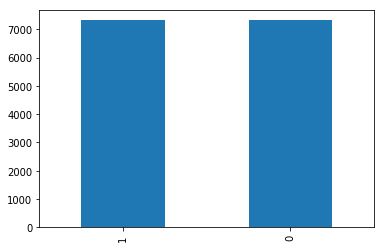

In [36]:
pd.Series(y_over1).value_counts().plot('bar')
pd.Series(y_over1).value_counts()

In [37]:
x_over1.shape

(14626, 44)

In [38]:
type(y_over1)

numpy.ndarray

In [39]:
type(x_over1)

numpy.ndarray

In [40]:
x=panda.iloc[:,:-1]
y=panda.iloc[:,-1]

In [41]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((11700, 44), (2926, 44), (11700,), (2926,))

In [42]:
model_1=DecisionTreeClassifier(criterion='gini',max_depth=None)
model_1.fit(x_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

# Grid Search CV

In [43]:
from sklearn.model_selection import GridSearchCV

In [44]:
model_tune=DecisionTreeClassifier()

In [45]:
tuned_parameter=[{'criterion':['gini','entropy'],'max_depth':range(2,10)}]

In [46]:
clf=GridSearchCV(model_tune,param_grid=tuned_parameter,cv=10,scoring='roc_auc')
clf.fit(x_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid=[{'criterion': ['gini', 'entropy'],
                          'max_depth': range(2, 10)}],
             pre_dis

In [47]:
clf.best_score_

0.9106924939388533

In [48]:
clf.best_params_

{'criterion': 'entropy', 'max_depth': 9}

# Creating a model with important Strategies

In [49]:
model_real=DecisionTreeClassifier(criterion='gini',max_depth=9)
model_real.fit(x_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=9,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [50]:
y_pred=model_real.predict(x_test)
y_pred_prob=model_real.predict_proba(x_test)[:,-1] # considering probability of 1

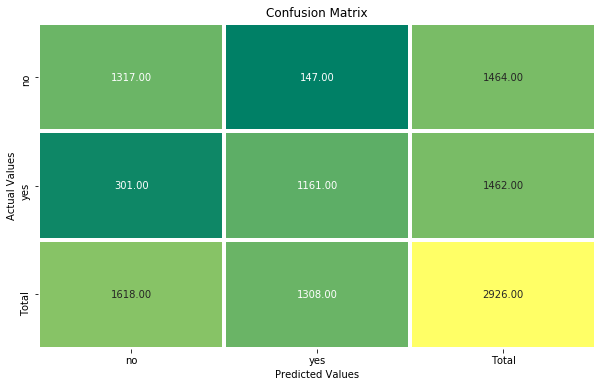

******************************Classifcation Report******************************


              precision    recall  f1-score   support

           0       0.81      0.90      0.85      1464
           1       0.89      0.79      0.84      1462

    accuracy                           0.85      2926
   macro avg       0.85      0.85      0.85      2926
weighted avg       0.85      0.85      0.85      2926


************************************Kappa Score************************************


Kappa Score = 0.6937577270310352

******************************Area Under Curve Score******************************


AUC Score = 0.8468539054966248
Number of probabilities to build ROC = 48


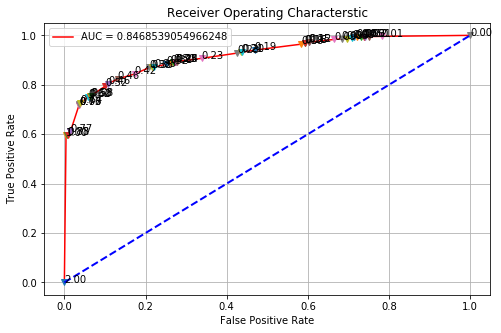

In [51]:
classification_metric(y_test,y_pred,y_pred_prob,['no','yes'],n=1,verbose=True)

In [52]:
import pydotplus

In [53]:
export_graphviz(model_real,out_file='HR_1.odt',feature_names=x_train.columns,filled=True)

In [54]:
graph_1=pydotplus.graph_from_dot_file('HR_1.odt')

In [55]:
graph_1.write_pdf('HR_tree_1.pdf')

True

In [56]:
graph_1.write_jpg('HR_tree_1.jpg')

True

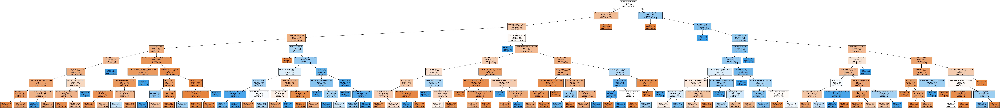

In [57]:
from IPython.display import Image
Image('HR_tree_1.jpg')